In [1]:
import numpy as np
import pandas as pd

Reading the protein:

In [2]:
from Bio import SeqIO
genome = SeqIO.read('/kaggle/input/grch38-human-genome-dna/Homo_sapiens.GRCh38.dna.chromosome.1.fa','fasta')

In [3]:
print('Length of the sequence: ',len(genome))

Length of the sequence:  248956422


In [4]:
genome_DNA = genome.seq

Finding out the distribution of nucleotides:

In [5]:
count_A = genome_DNA.count('A')
count_G = genome_DNA.count('G')
count_C = genome_DNA.count('C')
count_T = genome_DNA.count('T')

# Calculate the percentages
total_count = len(genome_DNA)
percentage_A = (count_A / total_count) * 100
percentage_G = (count_G / total_count) * 100
percentage_C = (count_C / total_count) * 100
percentage_T = (count_T / total_count) * 100

# Print the percentages
print("Percentage of A: {:.2f}%".format(percentage_A))
print("Percentage of G: {:.2f}%".format(percentage_G))
print("Percentage of C: {:.2f}%".format(percentage_C))
print("Percentage of T: {:.2f}%".format(percentage_T))

Percentage of A: 26.94%
Percentage of G: 19.33%
Percentage of C: 19.30%
Percentage of T: 27.01%


Plotting a graph to show distribution of nucleotides:

<BarContainer object of 4 artists>

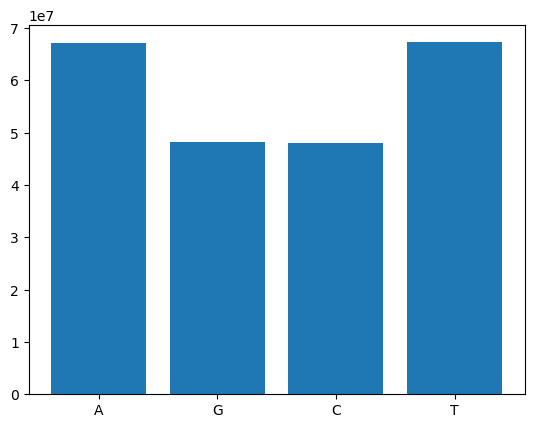

In [6]:
import matplotlib.pyplot as plt

nucleotides = {'A': count_A, 'G': count_G, 'C': count_C, 'T': count_T}

x = list(nucleotides.keys())
y = list(nucleotides.values())

plt.bar(x,y)

Transcribing to find the RNA:

In [7]:
genome_RNA = genome_DNA.transcribe()
print(genome_DNA[:100])
print(genome_RNA[:100])

NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN
NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN


A graph for RNA:

<BarContainer object of 4 artists>

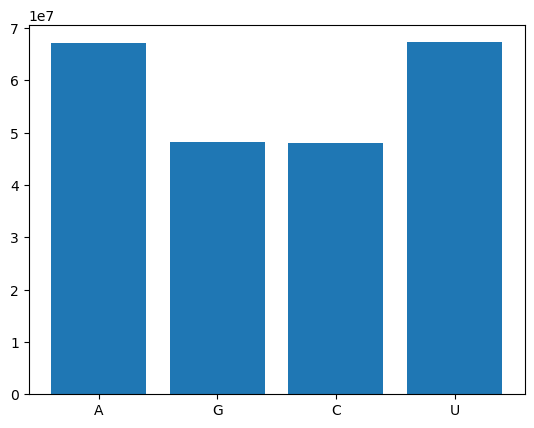

In [8]:
count_U = genome_RNA.count('U')

import matplotlib.pyplot as plt

ribonucleotides = {'A': count_A, 'G': count_G, 'C': count_C, 'U': count_U}

x = list(ribonucleotides.keys())
y = list(ribonucleotides.values())

plt.bar(x,y)

In [9]:
genome_pro = genome_DNA.translate()
print('DNA: ',genome_DNA[:100])
print('Proteins: ',genome_pro[:100])

DNA:  NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN
Proteins:  XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


Creating a checkpoint with the protein sequence:

In [10]:
file = open('/kaggle/working/checkpoint_genome_pro.txt','w')
checkpoint1 = file.write(str(genome_pro))
file.close()

In [11]:
functional_pro = str(genome_pro).split('*')

functional_pro = [i for i in functional_pro if len(i)>=20 if 'X' not in str(i)]

print('Number of Functional Proteins: ',len(functional_pro))

Number of Functional Proteins:  1290444


Creating a dataframe with 10% of the sequences:

In [12]:
import pandas as pd

df = pd.DataFrame(columns=['sequence no', 'amino acid sequence', 'sequence length'])

# Iterate over the extracted sequences and add them to the DataFrame
for i in range(len(functional_pro)//10):
    df.loc[i] = [i+1, str(functional_pro[i]), len(str(functional_pro[i]))]

df

,sequence no,amino acid sequence,sequence length
0,1,PSRYPQPARPPGSDLRRTVLRLQSTTEICAEDNAAPPSRCSPGLC,45
1,2,GERNSAVAKARRAGAGAERRAAPAQAQRGAPRRRRRREARRAGAGA...,222
2,3,SGGQRPLLAPGHCRALLLTV,20
3,4,WWHAACWQLGTLQGPLAQGVVAARPPAGSWGHCRALLLQQYWRIIG...,74
4,5,LPSELYCSVSHQQCLGMPVSPQSVYFWIFASLTGEALEILISDLGW...,57
...,...,...,...
129039,129040,ATAPGRKLFLFFEICSHSGCCPGWSAVAQPQLTAASTSRAQVILPP...,74
129040,129041,RLCLAHVYGYLQLPDSIWPVLPYSRHSCSYFWVFLLKLLKGKPHVL...,70
129041,129042,MEWIPLLSRNTKTIIPAHKNIMRTRTFKNTF,31
129042,129043,SQHFGRLRQVDHLRSGVRDQPGQHGETPSLLKIQNISWGWWRMPVI...,66


Model 1- K-Means Clustering, vectorization using Word2Vec:
(Best Approach Discovered)

In [13]:
import pandas as pd
from gensim.models import Word2Vec

sequences = []
column_sequences = df['amino acid sequence'].astype(str).tolist()
sequences.append(column_sequences)

# Train the Word2Vec model
word2vec_model = Word2Vec(sentences=sequences, vector_size=100, window=5, min_count=1, workers=4)

column_sequences = df['amino acid sequence'].astype(str).tolist()
column_vectors = [word2vec_model.wv[seq] for seq in column_sequences]

df['amino acid sequence_vector'] = column_vectors

In [14]:
df

,sequence no,amino acid sequence,sequence length,amino acid sequence_vector
0,1,PSRYPQPARPPGSDLRRTVLRLQSTTEICAEDNAAPPSRCSPGLC,45,"[-0.00046174237, 0.005225076, -0.0059980634, -..."
1,2,GERNSAVAKARRAGAGAERRAAPAQAQRGAPRRRRRREARRAGAGA...,222,"[-0.0056969756, 0.0050553563, 0.0034267046, -0..."
2,3,SGGQRPLLAPGHCRALLLTV,20,"[-0.0030454097, -0.004807517, 0.0016477596, -0..."
3,4,WWHAACWQLGTLQGPLAQGVVAARPPAGSWGHCRALLLQQYWRIIG...,74,"[0.0033930773, -0.0009864243, -0.008263298, -0..."
4,5,LPSELYCSVSHQQCLGMPVSPQSVYFWIFASLTGEALEILISDLGW...,57,"[-0.008553786, 0.0012054984, -0.008805803, -0...."
...,...,...,...,...
129039,129040,ATAPGRKLFLFFEICSHSGCCPGWSAVAQPQLTAASTSRAQVILPP...,74,"[-0.007224705, -0.0033027148, 0.0081440685, -0..."
129040,129041,RLCLAHVYGYLQLPDSIWPVLPYSRHSCSYFWVFLLKLLKGKPHVL...,70,"[-0.0041063046, -0.0038778163, -0.009490163, -..."
129041,129042,MEWIPLLSRNTKTIIPAHKNIMRTRTFKNTF,31,"[0.009719458, 0.0016387737, 0.005201948, 0.003..."
129042,129043,SQHFGRLRQVDHLRSGVRDQPGQHGETPSLLKIQNISWGWWRMPVI...,66,"[-0.0029528916, 0.001554172, -0.00022051572, -..."


In [15]:
import cudf
import cuml
import numpy as np

# Convert DataFrame column to cuDF DataFrame
vectors = df['amino acid sequence_vector'].values
vectors = np.stack(vectors)
vectors = cudf.DataFrame(vectors)

best_num_clusters = 100

# Create a cuML KMeans object
model = cuml.KMeans(n_clusters=best_num_clusters, random_state=42, n_init=100)

model.fit(vectors)

KMeans()

In [16]:
labels = model.predict(vectors).to_pandas().values
df['Cluster'] = labels

In [17]:
df['Cluster'].value_counts()

91    1447
65    1398
30    1392
22    1389
72    1367
      ... 
94    1213
38    1196
0     1187
29     851
85       1
Name: Cluster, Length: 100, dtype: int64

In [18]:
filtered_df = df[df['Cluster'] == 0]

In [19]:
filtered_df

,sequence no,amino acid sequence,sequence length,amino acid sequence_vector,Cluster
184,185,PKELKSICQRDICTPMLLQHVHNGQDIEST,30,"[0.00056510314, -0.0047982177, 0.0012680809, 0...",0
353,354,FQLLERLRWEDRLNLGGRSFSEPRTCLCTPARMTEQDSISKKKKKK...,72,"[-0.007367347, -0.0032784767, -0.0012587148, -...",0
378,379,GKIYCTENLRKKQERKFLWEIRILKSAYIQ,30,"[-0.0049425308, 0.0018288756, 0.009436021, 0.0...",0
387,388,HFKVLKEKNTVNQKFYNLEDAPSSIKDKLHIPRLKKRKREREKEKE...,123,"[-0.0067354846, 0.009498489, 0.000988027, 0.00...",0
522,523,YEKHISFIHSFQLMRKLRHWELVKVHIEI,29,"[-0.0010830571, 0.0051296446, -0.0014987289, 0...",0
...,...,...,...,...,...
128251,128252,SVRSLRFRVCHSIHDPGIGHESQWQTPEALRGVSHEDGKVVKFMQTIV,48,"[-0.0072776712, -0.00938762, 0.00867925, 0.003...",0
128503,128504,GKEGRNCWEGKSMVPINDIKRSEGSAGKGRAWSL,34,"[-0.00094816205, -0.0051602875, 0.0050700796, ...",0
128576,128577,LCDPPSLASQSAGITGVSHRAWPLIFIF,28,"[-0.0033254218, 0.00065104244, -0.0026688802, ...",0
128720,128721,KALLQYNEKKKIIFFSKHKNDLT,23,"[-0.0013910091, -0.0066289175, 0.003209548, 0....",0


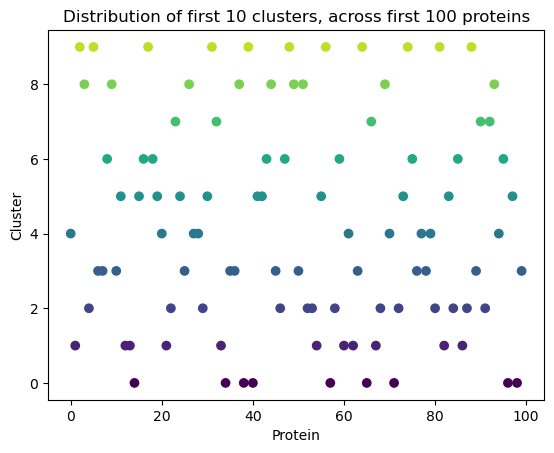

In [20]:
import matplotlib.pyplot as plt

x = [i for i in range(100)]
y = [i for i in df['Cluster'] if i < 10]
y = y[:100]

unique_y = list(set(y))
num_colors = len(unique_y)

# Use a colormap to assign unique colors to unique y values
cmap = plt.get_cmap('viridis')
colors = [cmap(i/num_colors) for i in range(num_colors)]

# Assign colors to y values based on their index in the unique_y list
c = [colors[unique_y.index(val)] for val in y]

plt.scatter(x, y, c=c)
plt.title('Distribution of first 10 clusters, across first 100 proteins')
plt.ylabel('Cluster')
plt.xlabel('Protein')
plt.show()

A graph between the clusters and the PCA

/tmp/ipykernel_24/1898764825.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('tab10', num_clusters)  # Use tab10 colormap with the number of clusters


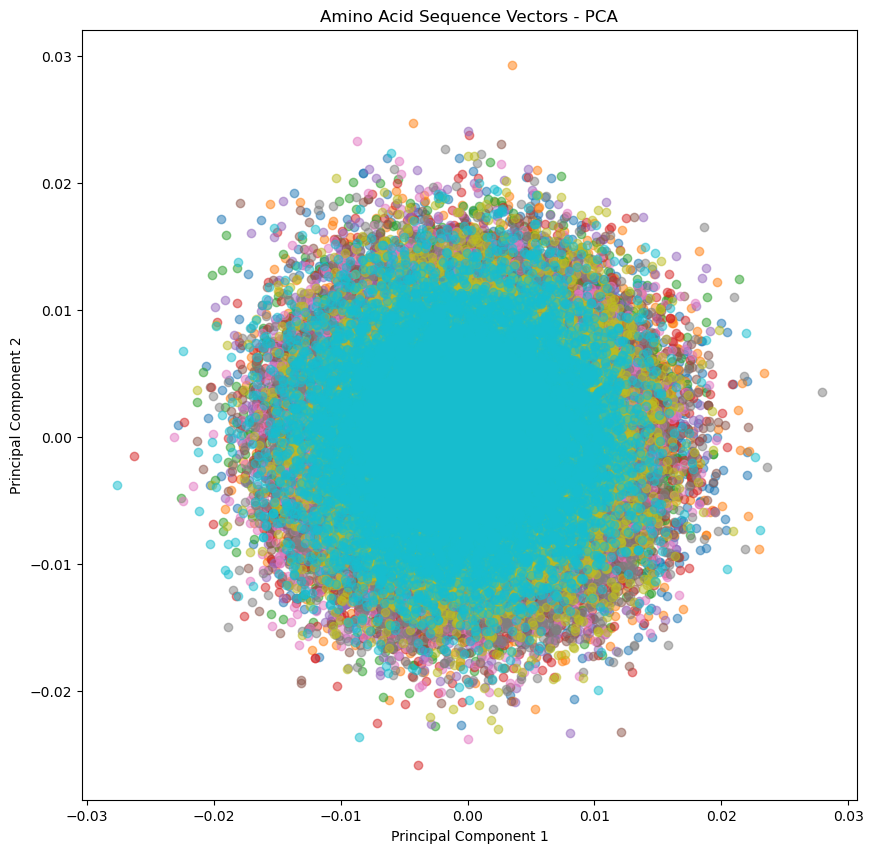

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

vectors = df['amino acid sequence_vector'].values
vectors = np.stack(vectors)

cluster_labels = df['Cluster']

num_clusters = 100

# Perform PCA on the word vectors
pca = PCA(n_components=2)
vectors_pca = pca.fit_transform(vectors)

# Define a color map for the clusters
color_map = plt.cm.get_cmap('tab10', num_clusters)  # Use tab10 colormap with the number of clusters

# Plot the word vectors with cluster colors
plt.figure(figsize=(10, 10))
for i in range(num_clusters):
    plt.scatter(vectors_pca[cluster_labels == i, 0], vectors_pca[cluster_labels == i, 1],
                color=color_map(i), alpha=0.5, label=f'Cluster {i+1}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Amino Acid Sequence Vectors - PCA')
plt.show()

In [22]:
import numpy as np
import plotly.graph_objs as go
from sklearn.decomposition import PCA

vectors = df['amino acid sequence_vector'].values
vectors = np.stack(vectors)

cluster_labels = df['Cluster']

num_clusters = 100

# Perform PCA on the word vectors
pca = PCA(n_components=3)
vectors_pca = pca.fit_transform(vectors)

# Create a 3D scatter plot
trace = go.Scatter3d(
    x=vectors_pca[:, 0],
    y=vectors_pca[:, 1],
    z=vectors_pca[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=cluster_labels,
        colorscale='Viridis',
        opacity=0.8
    )
)

# Create the layout
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='Principal Component 1'),
        yaxis=dict(title='Principal Component 2'),
        zaxis=dict(title='Principal Component 3')
    ),
    title='Amino Acid Sequence Vectors - PCA'
)

# Create the figure
fig = go.Figure(data=[trace], layout=layout)

# Display the interactive plot
fig.show()

Checkpoint 2: Saving the model

In [23]:
from sklearn.cluster import KMeans
import joblib

joblib.dump(model, '/kaggle/working/checkpoint2_model.pkl')

['/kaggle/working/checkpoint2_model.pkl']

Uncomment to load model:

In [24]:
#import joblib

#model = joblib.load('/kaggle/working/checkpoint2_model.pkl')

Running the model on the other 1/10th proteins that were ignored:

In [25]:
import pandas as pd

df_predict = pd.DataFrame(columns=['sequence no', 'amino acid sequence', 'sequence length'])

for i in range(len(functional_pro)//10, 2*len(functional_pro)//10):
    df_predict.loc[i] = [i+1, str(functional_pro[i]), len(str(functional_pro[i]))]

df_predict

,sequence no,amino acid sequence,sequence length
129044,129045,TQTNMFFLQSLQMWSQKKGEKRRRESL,27
129045,129046,LIQTLPDTFLRVRRRLSLHQC,21
129046,129047,NLAGEEVQMELFESRTFLGEEALWKLVFTEFSHV,34
129047,129048,ERFLRYEAAAYEIRSRSFLRAKLLLIEAGEHK,32
129048,129049,FPLQQEEKFFSMFMGLSFLFHSG,23
...,...,...,...
258083,258084,TQYSSWQWQSPLGPLPFYGSSVFTLLNLATAKRKKKREKKKKKRKN...,64
258084,258085,TINIVKISILHKAIYRVNTILIKIPATFFTEIEKNSNIHREPQKTP...,81
258085,258086,SLGKYSLFNKQCWENWISISS,21
258086,258087,MKLDPYFSPLFLMQEPTQNGLMT,23


In [26]:
#Vectorization
import pandas as pd
from gensim.models import Word2Vec

sequences = []
column_sequences = df_predict['amino acid sequence'].astype(str).tolist()
sequences.append(column_sequences)

# Train the Word2Vec model
word2vec_model = Word2Vec(sentences=sequences, vector_size=100, window=5, min_count=1, workers=4)

column_sequences = df_predict['amino acid sequence'].astype(str).tolist()
column_vectors = [word2vec_model.wv[seq] for seq in column_sequences]
df_predict['amino acid sequence_vector'] = column_vectors

In [27]:
df_predict

,sequence no,amino acid sequence,sequence length,amino acid sequence_vector
129044,129045,TQTNMFFLQSLQMWSQKKGEKRRRESL,27,"[0.008651078, -0.003720475, 0.0074478383, -0.0..."
129045,129046,LIQTLPDTFLRVRRRLSLHQC,21,"[-0.008230515, -0.003745185, -0.00036835717, -..."
129046,129047,NLAGEEVQMELFESRTFLGEEALWKLVFTEFSHV,34,"[-0.009118834, 0.0033656473, 0.0004136104, 0.0..."
129047,129048,ERFLRYEAAAYEIRSRSFLRAKLLLIEAGEHK,32,"[0.0060137636, -0.009247486, 0.0026245036, -0...."
129048,129049,FPLQQEEKFFSMFMGLSFLFHSG,23,"[0.008432179, -0.0071098288, 0.0061625973, 0.0..."
...,...,...,...,...
258083,258084,TQYSSWQWQSPLGPLPFYGSSVFTLLNLATAKRKKKREKKKKKRKN...,64,"[0.005478716, 0.006509216, 0.0005511439, -0.00..."
258084,258085,TINIVKISILHKAIYRVNTILIKIPATFFTEIEKNSNIHREPQKTP...,81,"[-0.009557569, -0.0039482927, 0.005349759, 0.0..."
258085,258086,SLGKYSLFNKQCWENWISISS,21,"[0.0037415577, 0.009151301, -0.004547428, 0.00..."
258086,258087,MKLDPYFSPLFLMQEPTQNGLMT,23,"[0.004212549, -0.0047163162, -0.0076354337, -0..."


In [28]:
vectors_predict = df_predict['amino acid sequence_vector'].values
vectors_predict = np.stack(vectors_predict)
vectors_predict = cudf.DataFrame(vectors_predict)

labels_predict = model.predict(vectors_predict).to_pandas().values
df_predict['Cluster'] = labels_predict

In [29]:
df_predict['Cluster'].value_counts()

91    1440
65    1398
30    1395
22    1385
40    1367
      ... 
94    1211
38    1196
0     1193
29     853
85       1
Name: Cluster, Length: 100, dtype: int64

A graph between clusters and PCA:

/tmp/ipykernel_24/1486834502.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



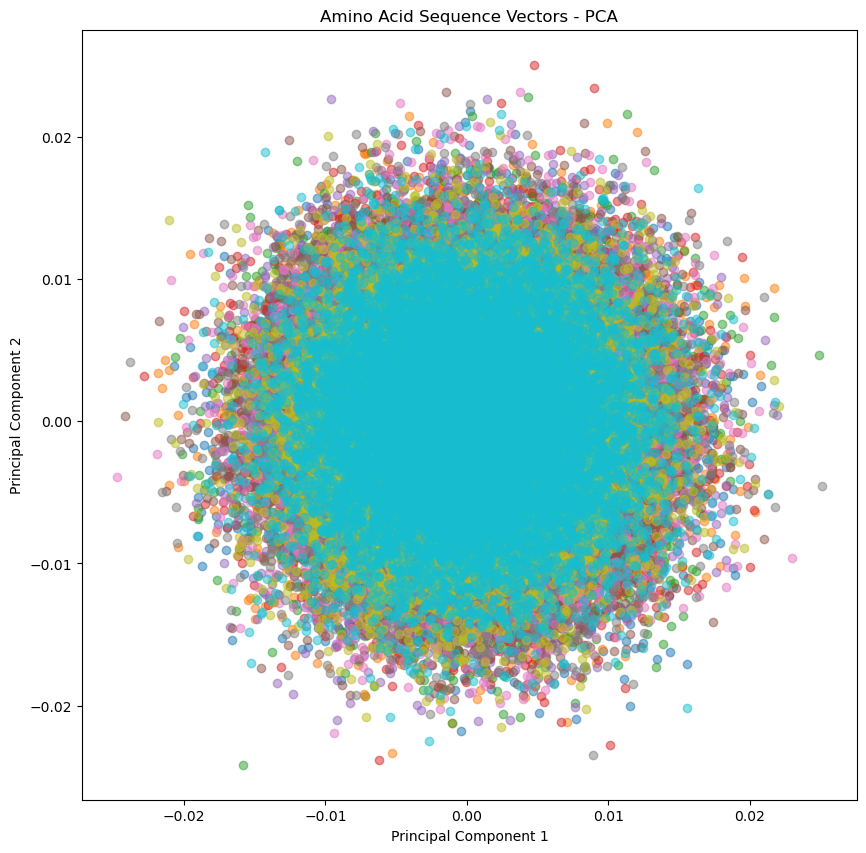

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

vectors_predict = df_predict['amino acid sequence_vector'].values
vectors_predict = np.stack(vectors)

cluster_predict_labels = df_predict['Cluster']

num_clusters = 100

# Perform PCA on the word vectors
pca = PCA(n_components=2)
vectors_predict_pca = pca.fit_transform(vectors)

# Define a color map for the clusters
color_map = plt.cm.get_cmap('tab10', num_clusters)  # Use tab10 colormap with the number of clusters

# Plot the word vectors with cluster colors
plt.figure(figsize=(10, 10))
for i in range(num_clusters):
    plt.scatter(vectors_predict_pca[cluster_predict_labels == i, 0], vectors_predict_pca[cluster_predict_labels == i, 1],
                color=color_map(i), alpha=0.5, label=f'Cluster {i+1}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Amino Acid Sequence Vectors - PCA')
plt.show()

In [31]:
import numpy as np
import plotly.graph_objs as go
from sklearn.decomposition import PCA

vectors_predict = df_predict['amino acid sequence_vector'].values
vectors_predict = np.stack(vectors_predict)

cluster_predict_labels = df_predict['Cluster']

num_clusters = 100

# Perform PCA on the word vectors
pca = PCA(n_components=3)
vectors_predict_pca = pca.fit_transform(vectors_predict)

# Create a 3D scatter plot
trace = go.Scatter3d(
    x=vectors_predict_pca[:, 0],
    y=vectors_predict_pca[:, 1],
    z=vectors_predict_pca[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=cluster_predict_labels,
        colorscale='Viridis',
        opacity=0.8
    )
)

# Create the layout
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='Principal Component 1'),
        yaxis=dict(title='Principal Component 2'),
        zaxis=dict(title='Principal Component 3')
    ),
    title='Amino Acid Sequence Vectors - PCA'
)

# Create the figure
fig = go.Figure(data=[trace], layout=layout)

# Display the interactive plot
fig.show()

This is a very rudimentary approach as I have not considered any structural data, or inferences from existing databases and models. The next task would be to compare this with an existing model, and analyse all chromosomes.

Note: Only 20% of Chromosome 1 is being used by the model.